<a href="https://colab.research.google.com/github/kutaydemiralay/Submarine-Tracking-via-Fourier-Filtering/blob/main/HW1_KutayDemiralay.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

The following code helps you visualize the submarine data and contains the crucial information about the data such as size of measurement domain, number of grid points and frequency modes etc.

Our first task is to import the data into python (similarly MATLAB). Three files are available, "subdata.npy" is a numpy binary file most conveninet for Python users. "subtata.mat" is best if you plan to use MATLAB and "subdata.csv" is the same data in text format if you are having trouble with the other formats. In MATLAB you can simply use the load command. In Python, and in particular if you are using something like Colab you need some utilities to load the data. Here's a small snippet for loading data from your Google drive.   

In [ ]:
from google.colab import drive

# the following command loads up your google drive. It will promp you to give Colab access to your Gdrive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np

data_path = '/content/drive/MyDrive/subdata.npy'

d = np.load(data_path) # huge matrix of size 262144 x 49 (columns contain flattened 3d matrix of size 64x64x64)
d

array([[-0.18426731-0.05165796j, -0.0614003 +0.03799275j,
         0.05141567+0.20886637j, ...,  0.04332048+0.022896j  ,
        -0.02306178+0.05690534j, -0.17170266+0.36906175j],
       [-0.21532552-0.27278968j, -0.18012117+0.08804689j,
         0.09184116+0.00641865j, ..., -0.02141145-0.23825016j,
        -0.1118139 +0.17602017j, -0.01903837-0.27906633j],
       [ 0.27324244+0.14121453j, -0.24369709-0.05479282j,
         0.18918822+0.30209408j, ..., -0.09193302-0.04081354j,
         0.19735484+0.08586096j, -0.17729558+0.02675028j],
       ...,
       [ 0.48921441+0.12840085j,  0.16500856+0.08276477j,
        -0.2785638 +0.22386542j, ..., -0.15937384+0.29182956j,
        -0.04414383-0.03958156j,  0.23279336-0.07130894j],
       [ 0.04544374-0.07758438j,  0.13307817-0.12444772j,
         0.06715193+0.09507054j, ..., -0.31797434-0.02931815j,
         0.02662444+0.1670792j ,  0.01338263-0.49327174j],
       [ 0.34368159-0.15830869j, -0.02184596+0.2450579j ,
        -0.10586678+0.02542427

In [ ]:
# import libraries for plotting isosurfaces
import plotly
import plotly.graph_objs as go
# utility for clearing output of cell as loop runs in notebook
from IPython.display import clear_output

# plot the data in time

L = 10; # length of spatial domain (cube of side L = 2*10)
N_grid = 64; # number of grid points/Fourier modes in each direction
xx = np.linspace(-L, L, N_grid+1) #spatial grid in x dir
x = xx[0:N_grid]
y = x # same grid in y,z direction
z = x

K_grid = (2*np.pi/(2*L))*np.linspace(-N_grid/2, N_grid/2 -1, N_grid) # frequency grid for one coordinate

xv, yv, zv = np.meshgrid( x, y, z) # generate 3D meshgrid for plotting

# plot iso surfaces for every third measurement

for j in range(0,49,3):

  signal = np.reshape(d[:, j], (N_grid, N_grid, N_grid))
  normal_sig_abs = np.abs(signal)/np.abs(signal).max()

  # generate data for isosurface of the 3D data
fig_data = go.Isosurface( x = xv.flatten(), y = yv.flatten(), z = zv.flatten(), value = normal_sig_abs.flatten(), isomin=0.7, isomax=0.7)

  # generate plots
clear_output(wait=True) # need this to discard previous figs
fig = go.Figure( data = fig_data )
fig.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
import pywt

In [ ]:

N_grid = 64
fhat=np.zeros(shape=(49, 64, 64, 64),dtype=complex)
sumfhat = np.zeros(shape=(64, 64, 64))
rawsignals = []

for time in range(49):
    rawsignal_at_time = np.reshape(d[:, time], (N_grid, N_grid, N_grid))
    fhat[time, :, :, :] = np.fft.fftshift(np.fft.fftn(rawsignal_at_time))
    sumfhat = sumfhat + fhat[time, :, :, :]

avgfhat=sumfhat/49

fhat_abs=np.abs (avgfhat)

centralfreq= np.unravel_index (np.argmax(fhat_abs, axis=None), fhat_abs.shape)
centralfreq= np.asarray(centralfreq)-[32,32,32]
print("Central Frequency", centralfreq)

# Calculate central frequencies in hertz for all dimensions
sampling_rate = 1.0  # Assuming unit sampling rate
central_frequencies_hz = np.fft.fftfreq(N_grid) * sampling_rate

# Extract the central frequencies along x, y, and z
central_frequencies_x = central_frequencies_hz[centralfreq[0]]
central_frequencies_y = central_frequencies_hz[centralfreq[1]]
central_frequencies_z = central_frequencies_hz[centralfreq[2]]

print("Central Frequency along X (Hz):", central_frequencies_x)
print("Central Frequency along Y (Hz):", central_frequencies_y)
print("Central Frequency along Z (Hz):", central_frequencies_z)

Central Frequency [  7  17 -22]
Central Frequency along X (Hz): 0.109375
Central Frequency along Y (Hz): 0.265625
Central Frequency along Z (Hz): -0.34375


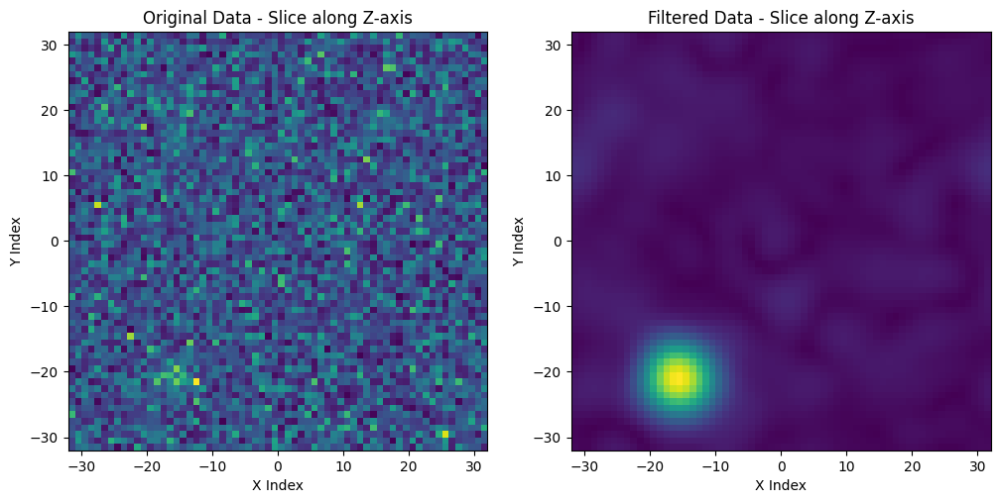

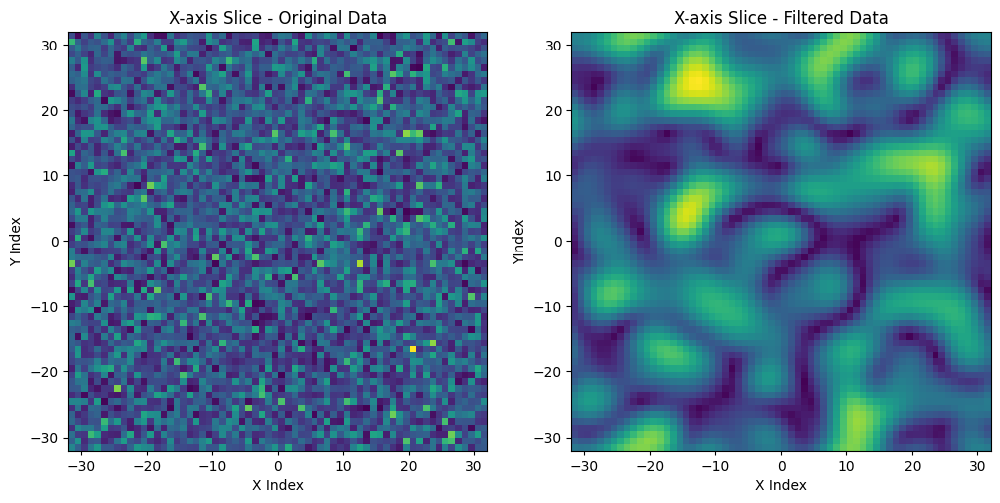

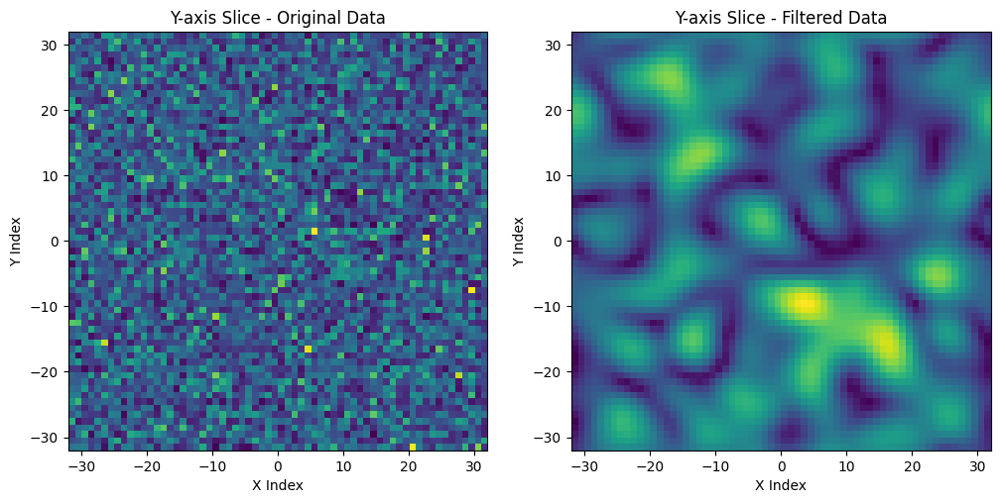

In [ ]:
import numpy as np
import scipy.ndimage
import matplotlib.pyplot as plt
import math


# Assuming centralfreq is calculated as before
centralfreq = np.asarray(centralfreq)

sigma = 3
N_grid = 64

# Create k_grid
k_grid = np.linspace(-N_grid // 2, N_grid // 2, N_grid)

# Create 3D Gaussian filter using meshgrid
kx, ky, kz = np.meshgrid(k_grid, k_grid, k_grid)

#intialize gaussian filter
gaussian_filter_shifted=np.zeros(shape=(64,64,64))

#create a shifted gaussian filter
for idx in range(64):
  for idy in range(64):
    for idz in range(64):
      gaussian_filter_shifted[idx,idy,idz]= (np.exp((-((idx-32-centralfreq[0])**2 + (idy-32-centralfreq[1])**2 + (idz-32-centralfreq[2])**2))/(2*sigma**2)))/(pow(2*np.pi,(3/2))*pow(sigma,3))


#İnitialize position
position= np.zeros(shape=(49,3))

# Apply the filter in the frequency domain
# Inverse FFT to filter the data
b=np.zeros((49,64,64,64),dtype=complex)
for time2 in range(49):
  a=fhat[time2,:,:,:]
  fhat_filtered= a*gaussian_filter_shifted
  b[time2,:,:,:]=np.abs(np.fft.ifftn(np.fft.ifftshift(fhat_filtered)))
  c=b[time2, :, :,:]
  position[time2,:] = np.asarray(np.unravel_index(np.argmax(c, axis=None),c.shape))-32

# Visualize the original and filtered data
# Visualize the Z-axis slice
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(np.abs(rawsignal_at_time[:, :, 32]), cmap='viridis',extent=(-32, 32, -32, 32))
plt.title('Original Data - Slice along Z-axis')
plt.xlabel('X Index')
plt.ylabel('Y Index')


plt.subplot(1, 2, 2)
img = plt.imshow(np.abs(b[48, :, :, 32]), cmap='viridis', extent=(-32, 32, -32, 32))
plt.title('Filtered Data - Slice along Z-axis')
plt.xlabel('X Index')
plt.ylabel('Y Index')

plt.show()

# Visualize the X-axis slice
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(np.abs(rawsignal_at_time[N_grid // 2, :, :]), cmap='viridis', extent=(-32, 32, -32, 32))
plt.title('X-axis Slice - Original Data')
plt.xlabel('X Index')
plt.ylabel('Y Index')

plt.subplot(1, 2, 2)
plt.imshow(np.abs(b[48, N_grid // 2, :, :]), cmap='viridis', extent=(-32, 32, -32, 32))
plt.title('X-axis Slice - Filtered Data')
plt.xlabel('X Index')
plt.ylabel('YIndex')


plt.show()


# Visualize the Y-axis slice
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.imshow(np.abs(rawsignal_at_time[:, N_grid // 2, :]), cmap='viridis', extent=(-32, 32, -32, 32))
plt.title('Y-axis Slice - Original Data')
plt.xlabel('X Index')
plt.ylabel('Y Index')

plt.subplot(1, 2, 2)
plt.imshow(np.abs(b[48, :, N_grid // 2, :]), cmap='viridis', extent=(-32, 32, -32, 32))
plt.title('Y-axis Slice - Filtered Data')
plt.xlabel('X Index')
plt.ylabel('Y Index')


plt.show()


Text(0, 0.5, 'z index')

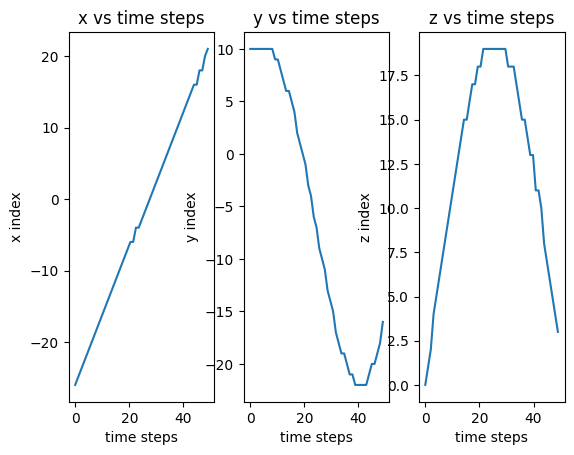

In [ ]:
import matplotlib.pyplot as plt


K_grid = np.linspace(0, 49, 49)

x, y= np.meshgrid(K_grid, K_grid)

#plot x,y,z position vs time step
plt.subplot(1, 3, 1)
plt.plot(K_grid, position[:,0])
plt.title('x vs time steps')
plt.xlabel('time steps')
plt.ylabel('x index')

plt.subplot(1, 3, 2)
plt.plot(K_grid, position[:,1])
plt.title('y vs time steps')
plt.xlabel('time steps')
plt.ylabel('y index')

plt.subplot(1, 3, 3)
plt.plot(K_grid, position[:,2])
plt.title('z vs time steps')
plt.xlabel('time steps')
plt.ylabel('z index')

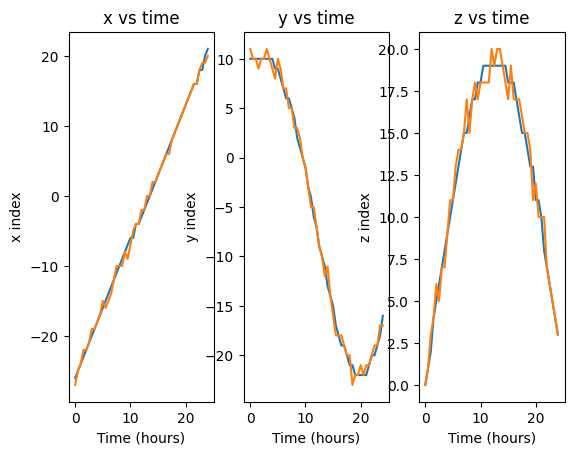

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


# Assuming each time step is half an hour
time_steps = 0.5 * np.arange(0, 49)

K_grid = np.linspace(0, 49, 49)

x, y = np.meshgrid(K_grid, K_grid)

# Apply the filter in the frequency domain
# Inverse FFT to filter the data
position1= np.zeros(shape=(49,3))
b1=np.zeros((49,64,64,64),dtype=complex)
for time3 in range(49):
  a1=fhat[time3,:,:,:]
  fhat_filtered1= a1
  b1[time3,:,:,:]=np.abs(np.fft.ifftn(np.fft.ifftshift(fhat_filtered1)))
  c1=b1[time3, :, :,:]
  position1[time3,:] = np.asarray(np.unravel_index(np.argmax(c1, axis=None),c.shape))-32

# Plot x, y, z position vs time
plt.subplot(1, 3, 1)
plt.plot(time_steps, position[:, 0],time_steps, position1[:, 0],label='Filtered Data')
plt.title('x vs time')
plt.xlabel('Time (hours)')
plt.ylabel('x index')

plt.subplot(1, 3, 2)
plt.plot(time_steps, position[:, 1],time_steps,position1[:, 1])
plt.title('y vs time')
plt.xlabel('Time (hours)')
plt.ylabel('y index')

plt.subplot(1, 3, 3)
plt.plot(time_steps, position[:, 2],time_steps,position1[:, 2])
plt.title('z vs time')
plt.xlabel('Time (hours)')
plt.ylabel('z index')

plt.show()


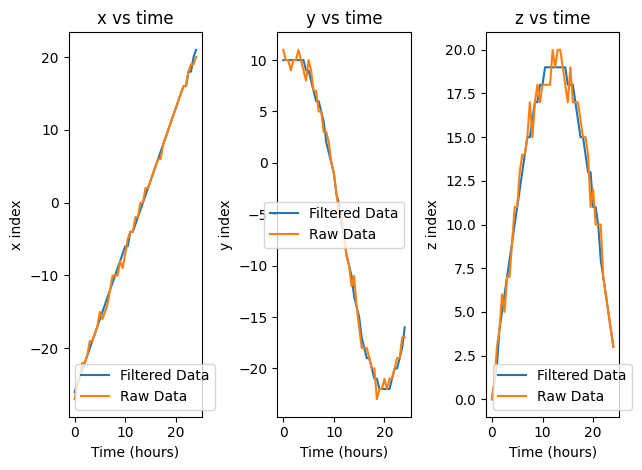

In [ ]:
import matplotlib.pyplot as plt

# Assuming time_steps, position, and position1 are defined

# Plot x vs time
plt.subplot(1, 3, 1)
plt.plot(time_steps, position[:, 0], label='Filtered Data')
plt.plot(time_steps, position1[:, 0], label='Raw Data')
plt.title('x vs time')
plt.xlabel('Time (hours)')
plt.ylabel('x index')
plt.legend()

# Plot y vs time
plt.subplot(1, 3, 2)
plt.plot(time_steps, position[:, 1], label='Filtered Data')
plt.plot(time_steps, position1[:, 1], label='Raw Data')
plt.title('y vs time')
plt.xlabel('Time (hours)')
plt.ylabel('y index')
plt.legend()

# Plot z vs time
plt.subplot(1, 3, 3)
plt.plot(time_steps, position[:, 2], label='Filtered Data')
plt.plot(time_steps, position1[:, 2], label='Raw Data')
plt.title('z vs time')
plt.xlabel('Time (hours)')
plt.ylabel('z index')
plt.legend()

plt.tight_layout()  # To prevent subplot overlap
plt.show()



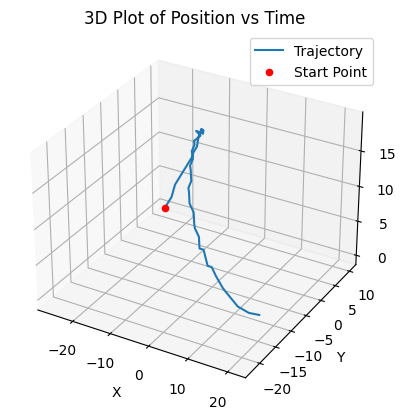

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

K_grid = np.linspace(0, 49, 49)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the trajectory
ax.plot(position[:, 0], position[:, 1], position[:, 2], label='Trajectory')

# Mark the start point
ax.scatter(position[0, 0], position[0, 1], position[0, 2], c='red', label='Start Point')

ax.set_title('3D Plot of Position vs Time')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.legend()

plt.show()


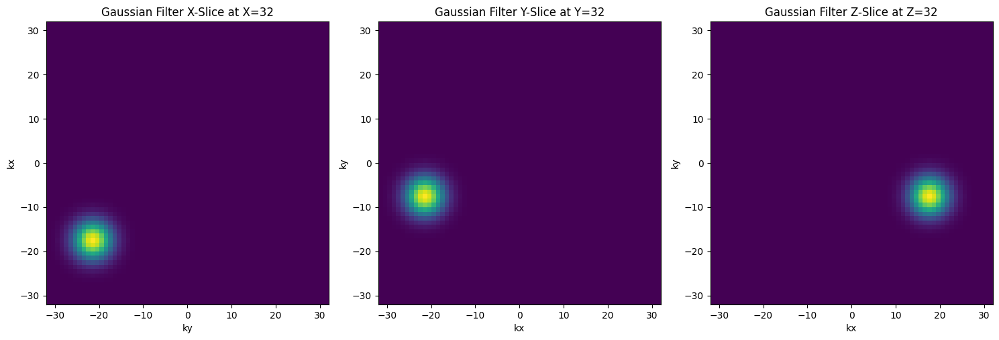

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

sigma = 3
N_grid = 64

# Create a 3D Gaussian filter
gaussian_filter_shifted = np.zeros(shape=(N_grid, N_grid, N_grid))

centralfreq = np.array([32, 32, 32])  # Update with your actual central frequency

for idz in range(N_grid):
    for idy in range(N_grid):
        for idx in range(N_grid):
            gaussian_filter_shifted[idx, idy, idz] = (
                np.exp(
                    -(
                        (idx - 7-32) ** 2
                        + (idy - 17-32) ** 2
                        + (idz +22-32) ** 2
                    )
                    / (2 * sigma ** 2)
                )
            ) / (pow(2 * np.pi, 3 / 2) * pow(sigma, 3))

# Plot x, y, z gaussian filter slices as subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# X-Slice
x_slice_index = 32
axes[0].imshow(gaussian_filter_shifted[x_slice_index, :, :], cmap='viridis',extent=(-32, 32, -32, 32))
axes[0].set_xlabel('ky')
axes[0].set_ylabel('kx')
axes[0].set_title(f'Gaussian Filter X-Slice at X=32')

# Y-Slice
y_slice_index = 32
axes[1].imshow(gaussian_filter_shifted[:, y_slice_index, :], cmap='viridis',extent=(-32, 32, -32, 32))
axes[1].set_xlabel('kx')
axes[1].set_ylabel('ky')
axes[1].set_title(f'Gaussian Filter Y-Slice at Y={y_slice_index}')

# Z-Slice
z_slice_index = 32
axes[2].imshow(gaussian_filter_shifted[:, :, z_slice_index], cmap='viridis', extent=(-32, 32, -32, 32))
axes[2].set_xlabel('kx')
axes[2].set_ylabel('ky')
axes[2].set_title(f'Gaussian Filter Z-Slice at Z={z_slice_index}')

plt.tight_layout()
plt.show()
